In [1]:
import pandas as pd
import json
import re
import tifffile as tiff
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.patches as patches

from PIL import Image
from tqdm import tqdm

from sklearn.linear_model import LinearRegression


import cv2

from tqdm import tqdm

## Get some frames

In [2]:
with tiff.TiffFile('4-2.tif') as tif:
    frames = tif.asarray()

f = []

for i in tqdm(range(len(frames))):
    f.append(frames[i][:, :, 0])

100%|██████████| 100/100 [00:00<00:00, 99911.96it/s]


## BG subtraction (for test, I will take a simple one)

In [3]:
def medianInit(frames:np.array)->np.array:
    """ 
    Function to initialize the background from the first frames

    Args:
    -----
    - `frames`: starting frames
    """
    bg = None

    for f in frames:
        if bg is None:
            bg = f.reshape(1, *f.shape)

        else:
            bg = np.vstack((bg, f.reshape(1, *f.shape)))

    return np.median(bg, axis=0).astype(int)





class background_sub():
    def __init__(self, frames, params):
        self.frames = frames

        self.alpha = params[0]                  # exponential filter

        self.threshold = params[1]              # threshold comparison

        self.nbIinit = params[2]                # number of frames to wait for the bg init

        self.initFrameId = params[2]-1           # id of the first frame

        self.methodUpdate = params[3]           # 0  if alpha is constnat, 1 for decreasing alpha

        self.nbFrames = 0                       # number of frames for the decreasing alpha

        self.binMaps = []                       # list of binary maps

        self.initVersion = params[4]            # 0: model, 1: median
        
    def _initBg(self, frames: list)->np.array:
        """ 
        Initialization of the algorithm

        Args:
        -----
        - `frames`: list of frames from which the init background is obtained
        """
        
        if self.initVersion == 0:
            bg = initialBackgroundv2(frames[0])     
        elif self.initVersion == 1:
            bg = medianInit(frames[:self.nbIinit])

        return bg

    def _updateBg(self, prevBg:np.array, frame:np.array, alpha:float, bMap:np.array)->np.array:
        """ 
        Function to perform the update

        Args:
        -----
        -`prevBg`: previous background
        - `frame`: current frame
        - `alpha`: learning rate
        - `bMap`: binary map from background subtraction (not used)
        """
        return ((1-alpha) * prevBg + alpha * frame)

    
    def _compareFrames(self, frame:np.array, bg:np.array, threshold:float)->np.array:
        """  
        Function to compare the background and the foreground

        Args:
        -----
        - `frame`: foreground
        - `bg`: background
        - `threshold`: threshold in the comparison

        Returns:
        --------
        The binary map
        """

        d = np.abs(bg - frame)

        bMap = (d >= threshold)
        return bMap


    def _loop(self):
        """ 
        Main function to apply the background subtraction algorithm
        """

        ## initialize the background
        bg = self._initBg(self.frames)

        for i in range(self.initFrameId, len(self.frames)):

            ## compare background and foreground
            bMap = self._compareFrames(self.frames[i], bg, self.threshold)
            
            self.binMaps.append(bMap)

            ## get the current alpha
            if self.methodUpdate:
                alpha = self.alpha / (self.nbFrames+1)
                self.nbFrames += 1
            else:
                alpha = self.alpha

            # update the background
            bg = self._updateBg(bg, self.frames[i], self.alpha, bMap)

            bg = bg.astype(int)
        return self.binMaps
    

bgS2 = background_sub(f, [0.10, 60, 6, 1, 1])

bMap = bgS2._loop()

## Ideas of pipeline

# IDEA 1

0) background subtraction (not necessary, not sure)
1) closing (deal with noise) (unecessary I think if the dilation is big enough afterwards)
2) dilate (upper bound on the estimate)
3) edge detection (Canny, Sobel or other)
4) detect shape (Circle transform, ...)
5) bounding box 

# Need to check if generalizes well when used with other images

In [5]:
def pipe1(image):
    ## Bsub done before
    
    ## closing

    radius = 25  # to change
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*radius+1, 2*radius+1))
    im2 = cv2.morphologyEx(image,  
                            cv2.MORPH_CLOSE, 
                            kernel, 
                            iterations=1)


    ## dilate

    radius = 10  # to change
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*radius+1, 2*radius+1))

    im3 = cv2.dilate(im2, kernel, iterations=1) 


    ## edge detection

    threshold = 2

    canny_output = cv2.Canny(im3, threshold, threshold * 2)

    ## hough circle transform

    circles = cv2.HoughCircles(canny_output, cv2.HOUGH_GRADIENT, 1.3, 500, param1=120, param2=45, minRadius=250, maxRadius=400)

    return circles

In [8]:
bList = []
fList = []
cList = []

for i in tqdm(range(len(bMap))):
    bg = bMap[i].astype(np.uint8)
    im = f[i+5]

    c = pipe1(bg)

    bList.append(bg)
    fList.append(np.tile(im[:, :, np.newaxis], (1,1,3)))
    cList.append(c)




100%|██████████| 95/95 [00:21<00:00,  4.32it/s]


In [ ]:
import matplotlib.animation as mat_anim
from IPython.display import HTML

def draw_frames(frames, clusterList, circles_list, threshList):
    if len(frames) != len(circles_list):
        raise Exception("The number of frames on each array doesn't match.")
    fig, axs = plt.subplots(1, 4, figsize=(16, 4))
    plt.tight_layout()

    def update(frame):
        plt.suptitle(f"Frame {frame}")
        axs[0].clear() 
        axs[1].clear()  
        axs[2].clear()  
        axs[3].clear()

        axs[0].set_title("Original")
        axs[0].imshow(frames[frame], cmap='gray')  

        axs[1].imshow(bList[frame], cmap='gray') 

        f2 = np.copy(frames[frame])

        for c in circles_list[frame][0, :]:
            c = c.astype(int)
            cv2.circle(f2, (c[0], c[1]), c[2], (0, 255, 0), 3)
            # Draw the center of the circle
            cv2.circle(f2, (c[0], c[1]), 1, (0, 0, 255), 5)

        axs[2].imshow(cv2.cvtColor(f2, cv2.COLOR_BGR2RGB))
        axs[2].set_title("Circles")
        return axs

    return mat_anim.FuncAnimation(fig=fig, func=update, frames=len(frames), interval=500)


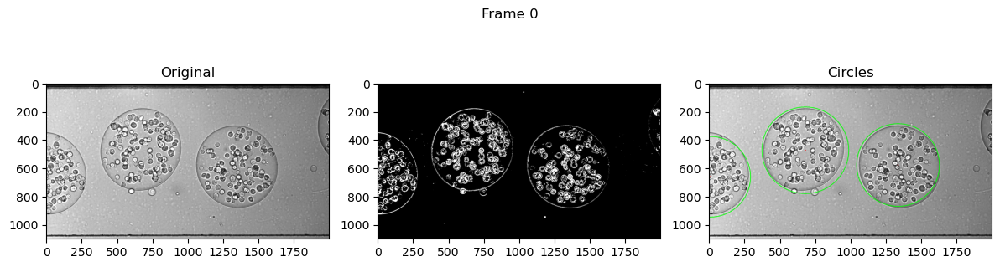

In [9]:
animation = draw_frames(fList, bList, cList)
HTML(animation.to_html5_video())

## Idea 2

0) background subtraction (not necessary I think)
1) closing (deal with noise)
2) dilate (upper bound on the estimate)
3) edge detection (Canny, Sobel or other)
4) detect shape (Circle transform, ...)
5) bounding box 

## Idea 3

It might be possibe to play with the edge pictures directly actually and some morphological operations

In [102]:
def decompComp(inds):
    res = []
    cList = []
    for i in range(len(inds)-1):
        if inds[i+1] == (inds[i]+1):
            cList.append(inds[i])
        else:
            cList.append(inds[i])
            cList = np.array(cList)
            res.append(cList)
            cList = []

    cList = np.array(cList)
    res.append(cList)

    return res

In [111]:
def findComponents(inds, im, L = 100, dec1 = 0, dec2 = 0, widthM1 = 900, widthM2 = 1400, width0 = 600):
    resList = []
    cList = []

    for i in range(len(inds)-1):
        if inds[i+1] == (inds[i]+1):
            cList.append(inds[i])
        else:
            cList.append(inds[i])
            cList = np.array(cList)
            if np.max(cList) > 450:
                if np.min(cList) < (im.shape[1]-450):

                    # should not be possible to have less than 100 in pixels
                    if len(cList) > L:
                        x0 = max(0, np.min(cList) - dec1)
                        x1 = min(np.max(cList) + dec2, im.shape[1])

                        # check if 3 cells are right next to the others
                        if(x1 - x0) > widthM2:
                            delta = (x1-x0)//3
                            x0Bis = x0 + delta
                            x0Bis2 = x0Bis + delta

                            resList.append([x0, x0Bis])
                            resList.append([x0Bis, x0Bis2])
                            resList.append([x0Bis2, x1])
                        elif (x1 - x0) > widthM1:
                            delta = (x1-x0)//2
                            x0Bis = x0 + delta

                            resList.append([x0, x0Bis])
                            resList.append([x0Bis, x1])
                        else:                 
                            if (x1 - x0)>width0:
                                if x1 == im.shape[1]:
                                    x1 = x0 + width0        # limit on the width of the window
                                elif x0 == 0:
                                    x0 = x1 - width0    

                                plt.imshow(im)
                                plt.show()
                                print(f'old ==> {x0} - {x1}')
                                x0, x1 = focus(im, x0, x1, 0.001)
                                print(f'new ==> {x0}-{x1}')

                            resList.append([x0, x1])

            cList = []
    if(len(cList) > 0):
        cList = np.array(cList)
        if np.max(cList) > 450:
            if np.min(cList) < im.shape[1]-450:          

                # should not be possible to have less than 100 in pixels
                if len(cList) > L:
                    x0 = max(0, np.min(cList) - dec1)
                    x1 = min(np.max(cList) + dec2, im.shape[1])
                    # check if 3 cells are right next to the others
                    if(x1 - x0) > widthM2:
                        delta = (x1-x0)//3
                        x0Bis = x0 + delta
                        x0Bis2 = x0Bis + delta

                        resList.append([x0, x0Bis])
                        resList.append([x0Bis, x0Bis2])
                        resList.append([x0Bis2, x1])
                    elif (x1 - x0) > widthM1:
                        delta = (x1-x0)//2
                        x0Bis = x0 + delta

                        resList.append([x0, x0Bis])
                        resList.append([x0Bis, x1])
                    else:                            

                        if (x1 - x0)>width0:
                            if x1 > im.shape[1] - 20:   # 20 is a parameter actually
                                x1 = x0 + width0        # limit on the width of the window
                            elif x0 < 20:
                                x0 = x1 - width0    

                            print(f'old ==> {x0} - {x1}')
                            x0, x1 = focus(im, x0, x1, 0.001)
                            print(f'new ==> {x0}-{x1}')

                        resList.append([x0, x1])

    return resList

In [112]:
def isolateCells1(im, thresh1 = 0.02, thresh2 = 0.05, L = 100, dec1 = 0, dec2 = 0):
    res = []
    
    v = np.var(im, axis=0)
    inds = np.where(v > thresh1)[0]

    indsX = findComponents(inds, im, L, dec1, dec2)


    for i in range(len(indsX)):
        v2 = np.var(im[:, indsX[i][0]:indsX[i][1]], axis = 1)
        indsY = np.where(v2 > thresh2)[0]

        res.append([[np.min(indsY), np.max(indsY)], indsX[i]])

    return res
    

  4%|▍         | 4/95 [00:00<00:21,  4.33it/s]

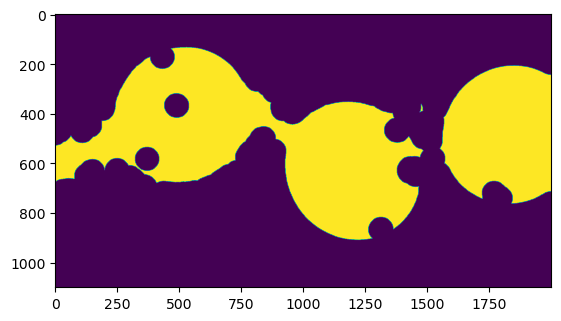

old ==> 169 - 812


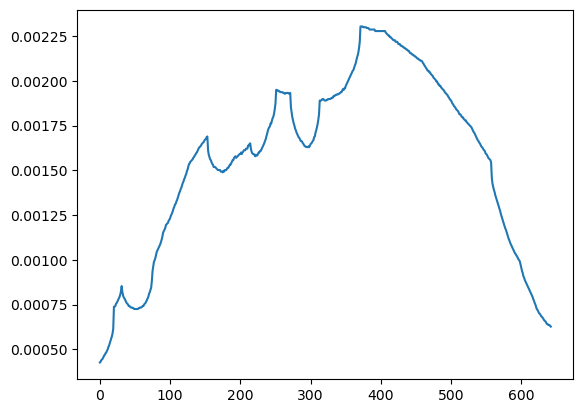

  5%|▌         | 5/95 [00:01<00:39,  2.26it/s]

new ==> 248-764


 28%|██▊       | 27/95 [00:07<00:16,  4.16it/s]

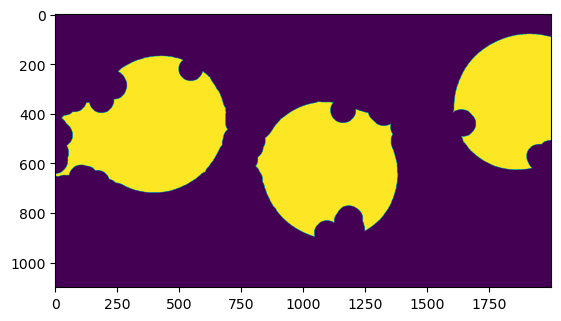

old ==> 35 - 693


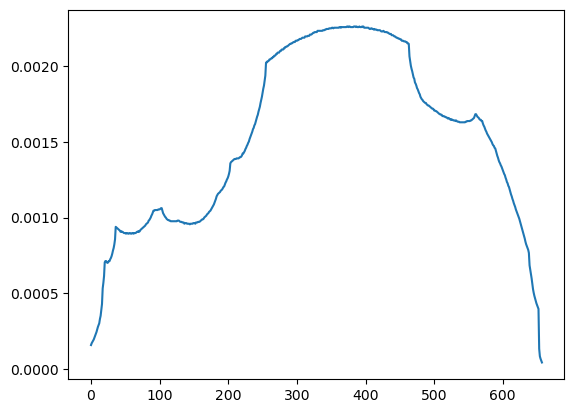

 29%|██▉       | 28/95 [00:07<00:25,  2.62it/s]

new ==> 200-657


 38%|███▊      | 36/95 [00:09<00:15,  3.87it/s]

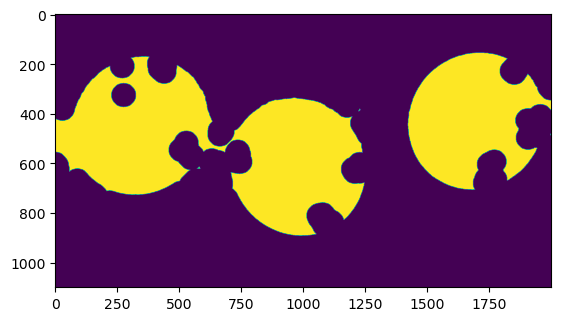

old ==> 32 - 633


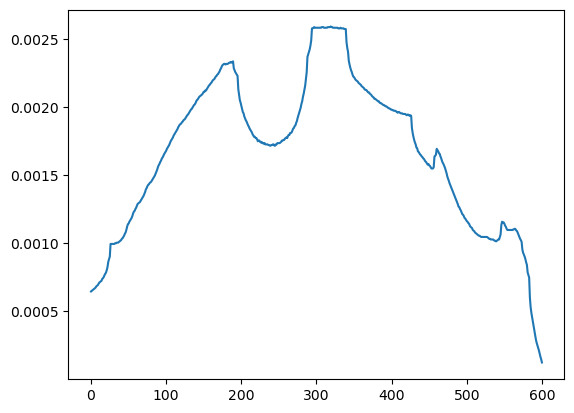

 39%|███▉      | 37/95 [00:10<00:21,  2.66it/s]

new ==> 66-604


 52%|█████▏    | 49/95 [00:13<00:11,  4.13it/s]

old ==> 1100 - 1700


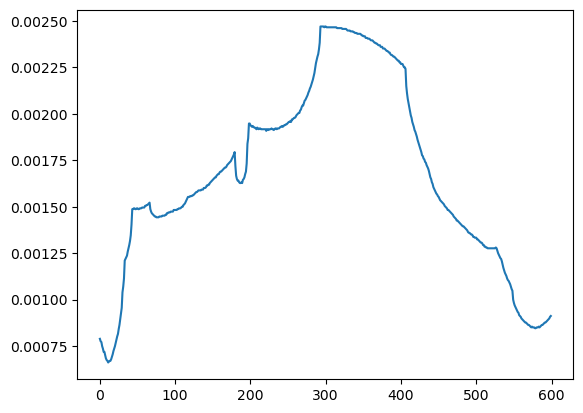

 53%|█████▎    | 50/95 [00:13<00:12,  3.53it/s]

new ==> 1130-1647


 54%|█████▎    | 51/95 [00:14<00:13,  3.34it/s]

old ==> 1218 - 1818


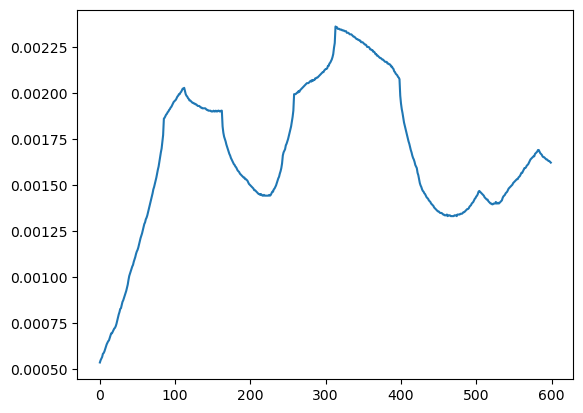

 55%|█████▍    | 52/95 [00:14<00:13,  3.14it/s]

new ==> 1257-1816


 58%|█████▊    | 55/95 [00:15<00:11,  3.58it/s]

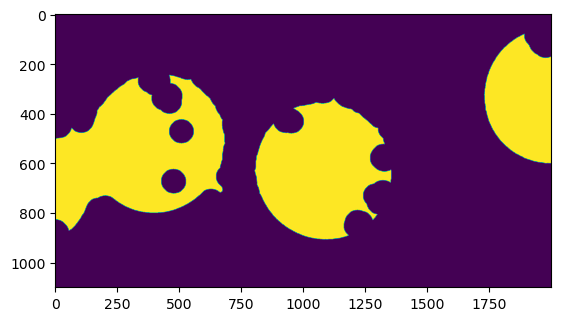

old ==> 93 - 693


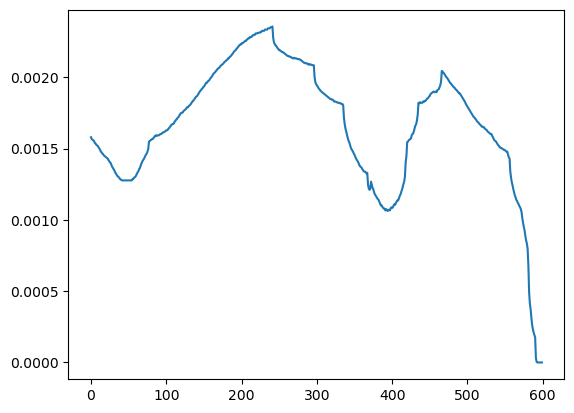

 59%|█████▉    | 56/95 [00:15<00:14,  2.67it/s]

new ==> 93-665


 60%|██████    | 57/95 [00:16<00:14,  2.63it/s]

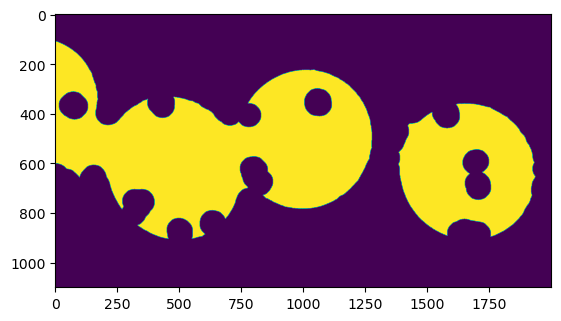

old ==> 179 - 779


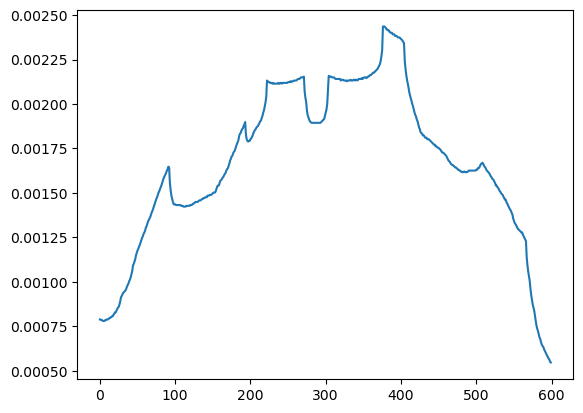

 61%|██████    | 58/95 [00:17<00:18,  2.01it/s]

new ==> 218-749


 62%|██████▏   | 59/95 [00:17<00:15,  2.32it/s]

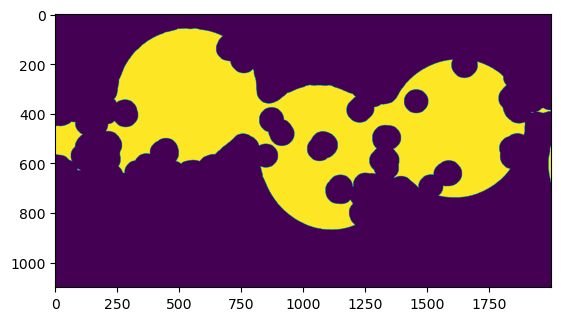

old ==> 242 - 843


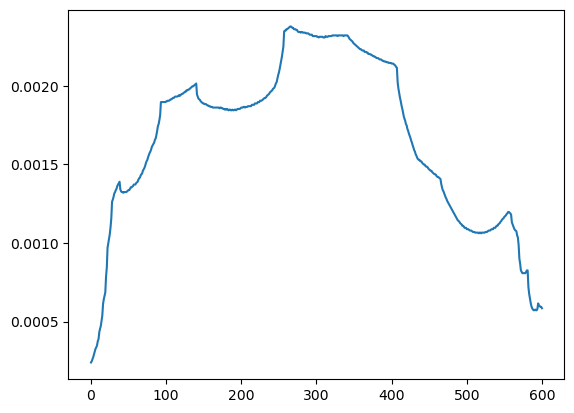

 63%|██████▎   | 60/95 [00:18<00:17,  1.98it/s]

new ==> 265-809


 69%|██████▉   | 66/95 [00:19<00:07,  3.78it/s]

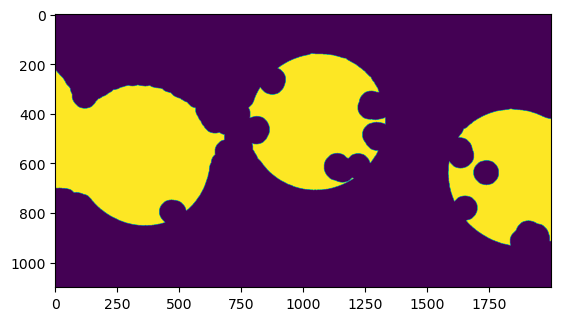

old ==> 38 - 638


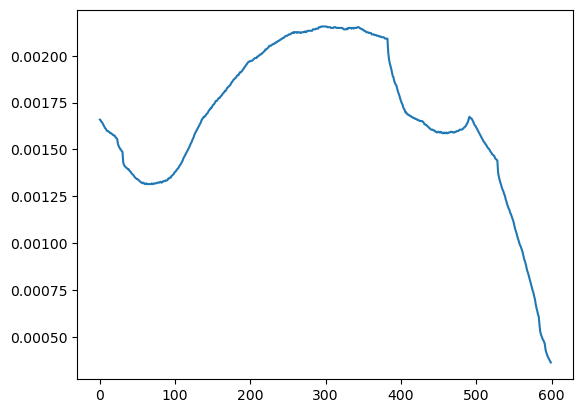

 71%|███████   | 67/95 [00:20<00:10,  2.65it/s]

new ==> 38-594


 85%|████████▌ | 81/95 [00:23<00:03,  4.07it/s]

old ==> 1259 - 1859


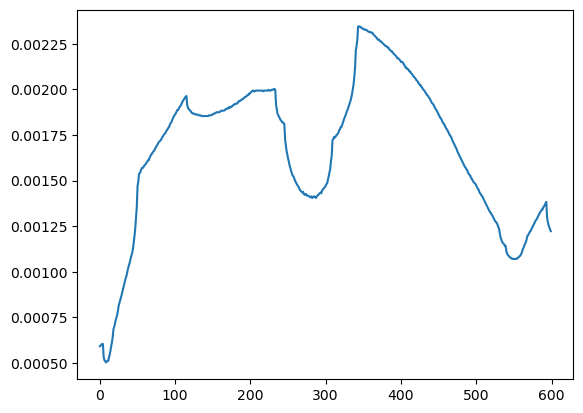

 86%|████████▋ | 82/95 [00:24<00:03,  3.65it/s]

new ==> 1296-1857


100%|██████████| 95/95 [00:27<00:00,  3.48it/s]


In [113]:
resList = []
bgList = []
fList = []

for id in tqdm(range(len(bMap))):
    imBg2 = bMap[id].astype(np.uint8)
    im = f[id+5]
    fList.append(im)

    radius = 32  # to change
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*radius+1, 2*radius+1))
    imBg2 = cv2.morphologyEx(imBg2,  
                            cv2.MORPH_CLOSE, 
                            kernel, 
                            iterations=1) 
    
    radius = 8
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*radius+1, 2*radius+1))
    imBg2 = cv2.erode(imBg2, kernel, iterations=2) 

    #radius = 20  # to change
    #kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*radius+1, 2*radius+1))
    #imBg2 = cv2.morphologyEx(imBg2,  
    #                        cv2.MORPH_OPEN, 
    #                        kernel, 
    #                        iterations=1) 
    
    bgList.append(imBg2)

    resList.append(isolateCells1(imBg2, thresh1 = 0.13, thresh2 = 0.05, dec1 = 20, dec2 = 20))


In [114]:
res = 0
inds = np.arange(-350, 350)
inds = 350**2 - inds **2
print(np.sum(inds))

57166550


In [115]:
print(resList[-1])

[[[394, 946], [486, 1050]], [[57, 603], [1336, 1828]]]


In [189]:
import matplotlib.animation as mat_anim
from IPython.display import HTML

def draw_frames(frames, bList, bounding_boxes):
    if len(frames) != len(bounding_boxes):
        raise Exception("The number of frames on each array doesn't match.")
    fig, axs = plt.subplots(1, 4, figsize=(16, 4))
    plt.tight_layout()

    def update(frame):
        plt.suptitle(f"Frame {frame}")
        axs[0].clear() 
        axs[1].clear()  
        axs[2].clear()  
        axs[3].clear()  

        axs[0].set_title("Original")
        axs[0].imshow(frames[frame], cmap='gray')  

        axs[1].imshow(bList[frame], cmap='gray') 

        f2 = np.copy(frames[frame])

        for b in bounding_boxes[frame]:
            cv2.rectangle(f2, (b[1][0], b[0][0]), (b[1][1], b[0][1]), (0, 255, 0), 2)

        axs[2].imshow(cv2.cvtColor(f2, cv2.COLOR_BGR2RGB))
        axs[2].set_title("Circles")

        axs[3].plot(np.var(bList[frame], axis=0), 'b')
        axs[3].plot(movingAverge(np.var(bList[frame], axis=0)), 'r')

        return axs

    return mat_anim.FuncAnimation(fig=fig, func=update, frames=len(frames), interval=500)


In [117]:
def focus(im, x0, x1, thresh):
    val = np.sum(im[:, x0:x1], axis=0)
    norm = np.sum(im[:, x0:x1])
    val = val / norm

    plt.plot(val)
    plt.show()

    inds = np.where(val >= thresh)[0]

    inds = decompComp(inds)

    Lmax = float('-inf')
    l = []
    for comp in inds:
        L = len(comp)
        if L > Lmax:
            Lmax = L
            l = comp
    return x0 + np.min(comp), x0 + np.max(comp)

In [118]:
# 11, r1 = 32, r2 = 8

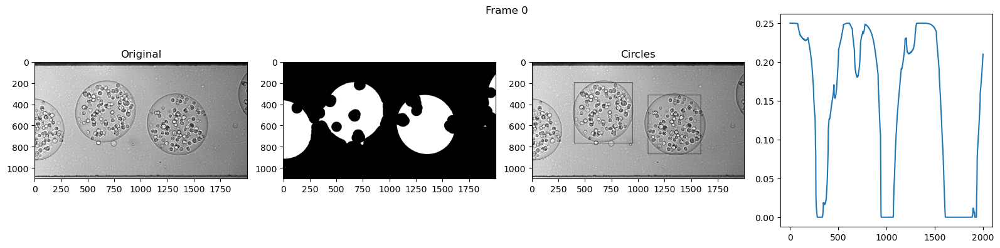

In [119]:
animation = draw_frames(fList, bgList, resList)
HTML(animation.to_html5_video())

## copy v2

In [159]:
def focusX(im, x0, x1, thresh):

    val = np.sum(im, axis=0)
    norm = np.sum(im)
    val = val / norm

    inds = np.where(val >= thresh)[0]

    inds = decompComp(inds)

    Lmax = float('-inf')
    l = []
    for comp in inds:
        L = len(comp)
        if L > Lmax and L > 0:
            Lmax = L
            l = comp
    try:
        return x0 + np.min(comp), x0 + np.max(comp)
    except:

        print(inds)
        plt.imshow(im)
        plt.show()

        plt.plot(val)
        plt.show()
        return x0, x1


def focusY(im, y0, y1, thresh):

    val = np.sum(im, axis=1)
    norm = np.sum(im)
    val = val / norm


    inds = np.where(val >= thresh)[0]

    inds = decompComp(inds)

    Lmax = float('-inf')
    l = []
    for comp in inds:
        L = len(comp)
        if L > Lmax and L > 0:
            Lmax = L
            l = comp
    try:
        return y0 + np.min(comp), y0 + np.max(comp)
    except:

        print(inds)
        plt.imshow(im)
        plt.show()

        plt.plot(val)
        plt.show()
        return y0, y1

In [254]:
def findComponents(inds, im, L = 100, dec1 = 0, dec2 = 0, widthM1 = 800, widthM2 = 1200, width0 = 600, widthm = 350):
    resList = []
    cList = []
    prevCheck = 0
    prevInter = None

    for i in range(len(inds)-1):
        if inds[i+1] == (inds[i]+1):
            cList.append(inds[i])
        else:
            cList.append(inds[i])
            cList = np.array(cList)
            if np.max(cList) > 450:
                if np.min(cList) < (im.shape[1]-450):

                    # should not be possible to have less than 100 in pixels
                    if len(cList) > L:
                        x0 = max(0, np.min(cList) - dec1)
                        x1 = min(np.max(cList) + dec2, im.shape[1])

                        # check if 3 cells are right next to the others
                        if(x1 - x0) > widthM2:
                            delta = (x1-x0)//3
                            x0Bis = x0 + delta
                            x0Bis2 = x0Bis + delta

                            resList.append([x0, x0Bis])
                            resList.append([x0Bis, x0Bis2])
                            resList.append([x0Bis2, x1])
                        elif (x1 - x0) > widthM1:
                            delta = (x1-x0)//2
                            x0Bis = x0 + delta

                            resList.append([x0, x0Bis])
                            resList.append([x0Bis, x1])
                        else:                 
                            if (x1 - x0)>width0:
                                if x1 >= (im.shape[1] - 20):
                                    x1 = x0 + width0        # limit on the width of the window
                                elif x0 >= 20:
                                    x0 = x1 - width0    

                            if x1 - x0 < widthm:
                                # check left merge

                                print(resList)


                                    

                                if prevCheck:
                                    if((prevInter[1] - prevInter[0]) + (x1 - x0)) < width0 and (x0 - prevInter[1]) < 50:
                                        inter = [prevInter[0], x1]
                                        resList.append(inter)

                                    prevCheck = 0


                                elif len(resList) > 0:
                                
                                    if ((resList[-1][1] - resList[-1][0]) + (x1 - x0)) < width0 and (x0 - resList[-1][1]) < 50:

                                        resList[-1][1] = x1

                                    else:
                                        prevCheck = 1
                                        prevInter = [x0, x1]

                                else:
                                    prevCheck = 1
                                    prevInter = [x0, x1]
                            

                            else:
                                resList.append([x0, x1])

            cList = []
    if(len(cList) > 0):
        cList = np.array(cList)
        if np.max(cList) > 450:
            if np.min(cList) < im.shape[1]-450:          

                # should not be possible to have less than 100 in pixels
                if len(cList) > L:
                    x0 = max(0, np.min(cList) - dec1)
                    x1 = min(np.max(cList) + dec2, im.shape[1])
                    # check if 3 cells are right next to the others
                    if(x1 - x0) > widthM2:
                        delta = (x1-x0)//3
                        x0Bis = x0 + delta
                        x0Bis2 = x0Bis + delta

                        resList.append([x0, x0Bis])
                        resList.append([x0Bis, x0Bis2])
                        resList.append([x0Bis2, x1])
                    elif (x1 - x0) > widthM1:
                        delta = (x1-x0)//2
                        x0Bis = x0 + delta

                        resList.append([x0, x0Bis])
                        resList.append([x0Bis, x1])
                    else:                            

                        if (x1 - x0)>width0:
                            if x1 > im.shape[1] - 20:   # 20 is a parameter actually
                                x1 = x0 + width0        # limit on the width of the window
                            elif x0 < 20:
                                x0 = x1 - width0    

                        if x1 - x0 < widthm:
                            # check left merge
                            if ((resList[-1][1] - resList[-1][0]) + (x1 - x0)) < width0 and (x0 - resList[-1][1]) < 50:

                                resList[-1][1] = x1
                                return resList
                            
                        resList.append([x0, x1])

    return resList

In [255]:
def isolateCells2(im, thresh1 = 0.02, thresh2 = 0.05, L = 100, dec1 = 0, dec2 = 0, sizeM = 750, threshX = 0.001, threshY = 0.001):
    res = []
    
    v = np.var(im, axis=0)
    v = np.array(movingAverge(v, nb = 30))
    inds = np.where(v > thresh1)[0]

    indsX = findComponents(inds, im, L, dec1, dec2)


    for i in range(len(indsX)):

        x0 = indsX[i][0]
        x1 = indsX[i][1]
    
        v2 = np.var(im[:, x0:x1], axis = 1)
        indsY = np.where(v2 > thresh2)[0]

        y0 = np.min(indsY)
        y1 = np.max(indsY)

        if (x1 - x0) > sizeM:

            print("x first")
            x0, x1 = focusX(im[y0:y1, x0:x1], x0, x1, threshX)
            print(f'x: {x0} ---- {x1}')
            y0, y1 = focusY(im[y0:y1, x0:x1], y0, y1, threshY)
            print(f'y: {y0} ---- {y1}')

        
        if (y1 - y0) > sizeM:
            print('y first')
            y0, y1 = focusY(im[y0:y1, x0:x1], y0, y1, threshY)
            print(f'y: {y0} ---- {y1}')
            x0, x1 = focusX(im[y0:y1, x0:x1], x0, x1, threshX)
            print(f'x: {x0} ---- {x1}')

        print("next")
        

        res.append([[y0, y1], indsX[i]])

    return res
    

In [256]:
def movingAverge(vect, nb:int = 3):
    res = (np.ones(nb) * np.mean(vect[:nb])).tolist()
    L = len(vect)

    for i in range(nb, L-nb):
        res.append(np.mean(vect[(i-nb):(i+nb)]))

    res.extend( (np.ones(nb) * np.mean(vect[-nb:])).tolist())
    return res

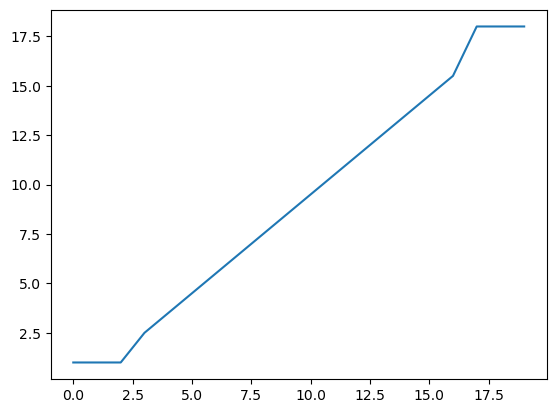

In [257]:
a = np.arange(20)
plt.plot(movingAverge(a))

  1%|          | 1/95 [00:00<00:50,  1.87it/s]

y first
y: 221 ---- 706
x: 460 ---- 924
next
y first
y: 346 ---- 865
x: 1093 ---- 1573
next


  2%|▏         | 2/95 [00:00<00:42,  2.17it/s]

y first
y: 386 ---- 844
x: 0 ---- 570
next
y first
y: 691 ---- 723
x: 879 ---- 1123
next
y first
y: 421 ---- 870
x: 1432 ---- 1907
next


  3%|▎         | 3/95 [00:01<00:38,  2.38it/s]

y first
y: 400 ---- 882
x: 336 ---- 875
next
y first
y: 244 ---- 712
x: 987 ---- 1515
next


  4%|▍         | 4/95 [00:01<00:37,  2.42it/s]

y first
y: 392 ---- 862
x: 631 ---- 1104
next
y first
y: 246 ---- 751
x: 1269 ---- 1754
next


  5%|▌         | 5/95 [00:02<00:36,  2.49it/s]

next
y first
y: 375 ---- 864
x: 926 ---- 1425
next


  6%|▋         | 6/95 [00:02<00:34,  2.55it/s]

y first
y: 163 ---- 637
x: 546 ---- 1061
next
y first
y: 355 ---- 869
x: 1297 ---- 1741
next


  7%|▋         | 7/95 [00:03<00:38,  2.26it/s]

y first
y: 357 ---- 839
x: 33 ---- 568
next
y first
y: 121 ---- 607
x: 852 ---- 1350
next


  8%|▊         | 8/95 [00:03<00:41,  2.09it/s]

y first
y: 358 ---- 848
x: 327 ---- 840
next
y first
y: 110 ---- 630
x: 1202 ---- 1651
next


  9%|▉         | 9/95 [00:04<00:43,  2.00it/s]

y first
y: 234 ---- 725
x: 0 ---- 544
next
y first
y: 325 ---- 867
x: 612 ---- 1043
next
y first
y: 168 ---- 644
x: 1485 ---- 1959
next


 11%|█         | 10/95 [00:04<00:38,  2.21it/s]

y first
y: 273 ---- 737
x: 343 ---- 831
next
y first
y: 373 ---- 820
x: 931 ---- 1358
next


 12%|█▏        | 11/95 [00:04<00:39,  2.13it/s]

y first
y: 453 ---- 941
x: 0 ---- 523
next
y first
y: 289 ---- 760
x: 597 ---- 1103
next
y first
y: 422 ---- 872
x: 1160 ---- 1697
next


 13%|█▎        | 12/95 [00:05<00:37,  2.23it/s]

y first
y: 956 ---- 976
x: 554 ---- 786
next
y first
y: 328 ---- 768
x: 891 ---- 1393
next
y first
y: 411 ---- 830
x: 1482 ---- 1998
next


 14%|█▎        | 13/95 [00:05<00:37,  2.17it/s]

y first
y: 487 ---- 912
x: 656 ---- 1226
next
y first
y: 278 ---- 778
x: 1221 ---- 1731
next


 15%|█▍        | 14/95 [00:06<00:35,  2.26it/s]

y first
y: 172 ---- 654
x: 205 ---- 673
next
y first
y: 470 ---- 940
x: 979 ---- 1510
next
y first
y: 330 ---- 828
x: 1497 ---- 1998
next


 16%|█▌        | 15/95 [00:06<00:35,  2.28it/s]

y first
y: 146 ---- 647
x: 555 ---- 972
next
y first
y: 521 ---- 953
x: 1302 ---- 1776
next


 17%|█▋        | 16/95 [00:07<00:33,  2.33it/s]

next
y first
y: 199 ---- 650
x: 902 ---- 1354
next


 18%|█▊        | 17/95 [00:07<00:33,  2.33it/s]

y first
y: 323 ---- 861
x: 253 ---- 727
next
next


 19%|█▉        | 18/95 [00:08<00:34,  2.25it/s]

y first
y: 415 ---- 815
x: 528 ---- 1063
next
y first
y: 164 ---- 618
x: 1463 ---- 1917
next


 20%|██        | 19/95 [00:08<00:36,  2.06it/s]

y first
y: 208 ---- 707
x: 156 ---- 693
next
y first
y: 356 ---- 821
x: 857 ---- 1334
next


 21%|██        | 20/95 [00:09<00:39,  1.90it/s]

y first
y: 255 ---- 737
x: 458 ---- 967
next
y first
y: 341 ---- 844
x: 1142 ---- 1599
next


 22%|██▏       | 21/95 [00:09<00:40,  1.83it/s]

y first
y: 360 ---- 891
x: 136 ---- 595
next
y first
y: 275 ---- 718
x: 751 ---- 1230
next
y first
y: 295 ---- 797
x: 1421 ---- 1899
next


 23%|██▎       | 22/95 [00:10<00:40,  1.79it/s]

y first
y: 377 ---- 854
x: 393 ---- 908
next
y first
y: 210 ---- 751
x: 1052 ---- 1487
next


 24%|██▍       | 23/95 [00:11<00:42,  1.71it/s]

y first
y: 660 ---- 684
x: 167 ---- 413
next
y first
y: 350 ---- 856
x: 696 ---- 1179
next
y first
y: 311 ---- 738
x: 1346 ---- 1837
next


 25%|██▌       | 24/95 [00:11<00:41,  1.71it/s]

y first
y: 200 ---- 612
x: 402 ---- 909
next
y first
y: 348 ---- 826
x: 1066 ---- 1513
next


 26%|██▋       | 25/95 [00:12<00:41,  1.68it/s]

y first
y: 867 ---- 907
x: 112 ---- 348
next
y first
y: 200 ---- 662
x: 692 ---- 1199
next
y first
y: 367 ---- 824
x: 1314 ---- 1818
next


 27%|██▋       | 26/95 [00:13<00:46,  1.48it/s]

y first
y: 390 ---- 853
x: 245 ---- 774
next
y first
y: 187 ---- 618
x: 1020 ---- 1511
next


 28%|██▊       | 27/95 [00:13<00:44,  1.53it/s]

y first
y: 354 ---- 855
x: 543 ---- 1010
next
y first
y: 109 ---- 605
x: 1790 ---- 1806
next


 29%|██▉       | 28/95 [00:14<00:43,  1.56it/s]

y first
y: 225 ---- 692
x: 196 ---- 645
next
y first
y: 386 ---- 826
x: 838 ---- 1364
next


 31%|███       | 29/95 [00:15<00:43,  1.53it/s]

y first
y: 223 ---- 713
x: 444 ---- 931
next
y first
y: 832 ---- 888
x: 1428 ---- 1597
next


 32%|███▏      | 30/95 [00:15<00:41,  1.58it/s]

[[0, 457], [766, 1241]]
y first
y: 378 ---- 817
x: 0 ---- 452
next
y first
y: 201 ---- 637
x: 747 ---- 1253
next


 33%|███▎      | 31/95 [00:16<00:40,  1.58it/s]

y first
y: 891 ---- 906
x: 502 ---- 729
next
y first
y: 190 ---- 629
x: 1047 ---- 1552
next


 34%|███▎      | 32/95 [00:16<00:39,  1.61it/s]

y first
y: 408 ---- 882
x: 616 ---- 1104
next
next


 35%|███▍      | 33/95 [00:17<00:37,  1.64it/s]

y first
y: 194 ---- 706
x: 273 ---- 762
next
y first
y: 375 ---- 882
x: 923 ---- 1366
next


 36%|███▌      | 34/95 [00:18<00:38,  1.59it/s]

y first
y: 232 ---- 667
x: 551 ---- 1061
next
y first
y: 351 ---- 847
x: 1270 ---- 1715
next


 37%|███▋      | 35/95 [00:18<00:38,  1.55it/s]

y first
y: 393 ---- 823
x: 102 ---- 584
next
y first
y: 233 ---- 639
x: 822 ---- 1337
next
y first
y: 410 ---- 861
x: 1529 ---- 1998
next


 38%|███▊      | 36/95 [00:19<00:37,  1.59it/s]

y first
y: 342 ---- 805
x: 424 ---- 866
next
y first
y: 210 ---- 706
x: 1169 ---- 1624
next


 39%|███▉      | 37/95 [00:20<00:36,  1.57it/s]

y first
y: 241 ---- 698
x: 86 ---- 602
next
y first
y: 339 ---- 838
x: 757 ---- 1230
next
y first
y: 155 ---- 675
x: 1469 ---- 1934
next


 40%|████      | 38/95 [00:20<00:34,  1.64it/s]

y first
y: 220 ---- 644
x: 414 ---- 906
next
y first
y: 388 ---- 818
x: 1049 ---- 1515
next


 41%|████      | 39/95 [00:21<00:34,  1.63it/s]

y first
y: 387 ---- 933
x: 34 ---- 516
next
y first
y: 164 ---- 663
x: 1231 ---- 1232
next
y first
y: 417 ---- 880
x: 1354 ---- 1791
next


 42%|████▏     | 40/95 [00:21<00:33,  1.65it/s]

y first
y: 414 ---- 932
x: 330 ---- 849
next
y first
y: 188 ---- 662
x: 1031 ---- 1511
next


 43%|████▎     | 41/95 [00:22<00:32,  1.66it/s]

y first
y: 413 ---- 863
x: 638 ---- 1165
next
y first
y: 205 ---- 636
x: 1317 ---- 1876
next


 44%|████▍     | 42/95 [00:22<00:31,  1.67it/s]

y first
y: 192 ---- 618
x: 184 ---- 721
next
y first
y: 437 ---- 948
x: 1022 ---- 1455
next


 45%|████▌     | 43/95 [00:23<00:31,  1.67it/s]

y first
y: 163 ---- 654
x: 502 ---- 965
next
y first
y: 403 ---- 943
x: 1363 ---- 1792
next


 46%|████▋     | 44/95 [00:24<00:35,  1.45it/s]

y first
y: 342 ---- 802
x: 0 ---- 510
next
y first
y: 174 ---- 689
x: 1286 ---- 1325
next


 47%|████▋     | 45/95 [00:25<00:34,  1.44it/s]

y first
y: 345 ---- 788
x: 300 ---- 788
next
y first
y: 157 ---- 632
x: 1098 ---- 1597
next


 48%|████▊     | 46/95 [00:25<00:33,  1.45it/s]

y first
y: 242 ---- 723
x: 0 ---- 465
next
y first
y: 311 ---- 852
x: 603 ---- 1031
next
next


 49%|████▉     | 47/95 [00:26<00:32,  1.49it/s]

y first
y: 274 ---- 746
x: 294 ---- 779
next
y first
y: 373 ---- 822
x: 841 ---- 1346
next


 51%|█████     | 48/95 [00:27<00:30,  1.53it/s]

y first
y: 363 ---- 847
x: 0 ---- 441
next
y first
y: 287 ---- 713
x: 543 ---- 1074
next
y first
y: 354 ---- 823
x: 1133 ---- 1614
next


 52%|█████▏    | 49/95 [00:27<00:30,  1.51it/s]

y first
y: 390 ---- 848
x: 257 ---- 741
next
y first
y: 266 ---- 751
x: 817 ---- 1282
next
y first
y: 334 ---- 783
x: 1400 ---- 1944
next


 53%|█████▎    | 50/95 [00:28<00:29,  1.55it/s]

y first
y: 108 ---- 644
x: 0 ---- 458
next
y first
y: 394 ---- 888
x: 572 ---- 1057
next
y first
y: 200 ---- 762
x: 1122 ---- 1594
next
y first
y: 127 ---- 606
x: 245 ---- 775
next
y first
[array([ 81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,  92,  93,
        94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104, 105, 106,
       107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119,
       120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132,
       133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145,
       146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158,
       159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171,
       172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184,
       185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197,
       198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210,
       211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223,
       224, 225, 2

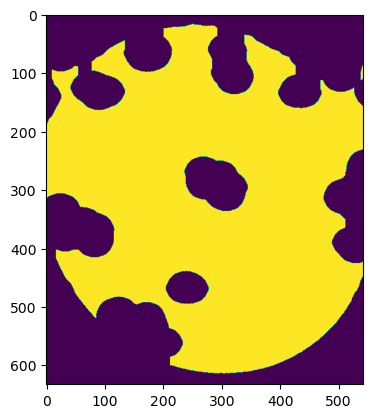

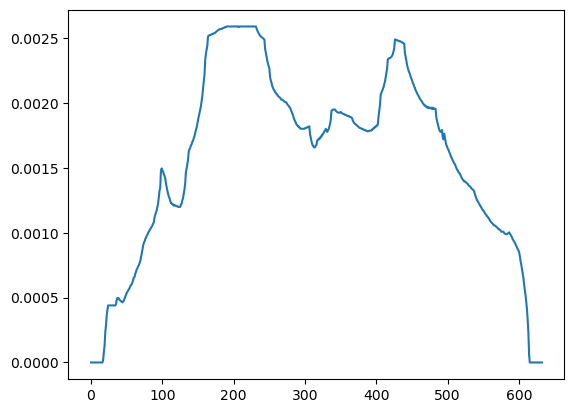

 54%|█████▎    | 51/95 [00:30<00:43,  1.01it/s]

y: 321 ---- 954
x: 912 ---- 1402
next
y first
y: 213 ---- 698
x: 1987 ---- 1998
next


 55%|█████▍    | 52/95 [00:30<00:37,  1.13it/s]

y first
y: 101 ---- 578
x: 555 ---- 1048
next
x first
x: 1760 ---- 1855
y: 310 ---- 718
next


 56%|█████▌    | 53/95 [00:31<00:33,  1.26it/s]

y first
y: 358 ---- 848
x: 0 ---- 486
next
next
y first
y: 421 ---- 860
x: 1525 ---- 1998
next


 57%|█████▋    | 54/95 [00:31<00:30,  1.36it/s]

y first
y: 391 ---- 808
x: 238 ---- 734
next
y first
y: 139 ---- 552
x: 1144 ---- 1638
next


 58%|█████▊    | 55/95 [00:32<00:27,  1.44it/s]

y first
y: 387 ---- 809
x: 528 ---- 1049
next
y first
y: 123 ---- 586
x: 1892 ---- 1959
next


 59%|█████▉    | 56/95 [00:33<00:26,  1.48it/s]

x first
x: 147 ---- 674
y: 297 ---- 750
next
y first
y: 882 ---- 903
x: 954 ---- 1184
next


 60%|██████    | 57/95 [00:33<00:25,  1.48it/s]

y first
y: 368 ---- 898
x: 0 ---- 493
next
y first
y: 242 ---- 751
x: 455 ---- 940
next
y first
y: 428 ---- 861
x: 1108 ---- 1600
next


 61%|██████    | 58/95 [00:34<00:24,  1.54it/s]

y first
y: 384 ---- 678
x: 0 ---- 438
next
y first
y: 344 ---- 809
x: 792 ---- 858
next
y first
y: 226 ---- 765
x: 820 ---- 1275
next
next


 62%|██████▏   | 59/95 [00:35<00:23,  1.55it/s]

y first
y: 116 ---- 623
x: 498 ---- 506
next
y first
y: 354 ---- 798
x: 511 ---- 1052
next
y first
y: 242 ---- 718
x: 1014 ---- 1554
next


 63%|██████▎   | 60/95 [00:35<00:22,  1.54it/s]

x first
x: 801 ---- 817
y: 568 ---- 599
next
y first
y: 755 ---- 870
x: 900 ---- 1208
next
y first
y: 702 ---- 729
x: 1540 ---- 1750
next


 64%|██████▍   | 61/95 [00:36<00:21,  1.55it/s]

next
y first
y: 300 ---- 787
x: 1095 ---- 1601
next


 65%|██████▌   | 62/95 [00:37<00:21,  1.57it/s]

y first
y: 392 ---- 860
x: 66 ---- 536
next
next
y first
y: 305 ---- 811
x: 1426 ---- 1847
next


 66%|██████▋   | 63/95 [00:37<00:20,  1.59it/s]

y first
y: 375 ---- 886
x: 406 ---- 854
next
next


 67%|██████▋   | 64/95 [00:38<00:18,  1.64it/s]

y first
y: 403 ---- 892
x: 667 ---- 1172
next
next


 68%|██████▊   | 65/95 [00:38<00:18,  1.66it/s]

y first
y: 194 ---- 673
x: 192 ---- 706
next
y first
y: 417 ---- 906
x: 986 ---- 1431
next


 69%|██████▉   | 66/95 [00:39<00:17,  1.70it/s]

y first
y: 220 ---- 679
x: 558 ---- 1011
next
y first
y: 421 ---- 897
x: 1273 ---- 1767
next


 71%|███████   | 67/95 [00:39<00:16,  1.73it/s]

x first
x: 565 ---- 570
y: 607 ---- 660
next
y first
y: 178 ---- 673
x: 821 ---- 1283
next


 72%|███████▏  | 68/95 [00:40<00:15,  1.72it/s]

y first
y: 323 ---- 815
x: 433 ---- 877
next
y first
y: 191 ---- 655
x: 1099 ---- 1557
next


 73%|███████▎  | 69/95 [00:41<00:15,  1.69it/s]

y first
y: 229 ---- 695
x: 679 ---- 688
next
y first
y: 335 ---- 815
x: 1193 ---- 1200
next
y first
y: 200 ---- 705
x: 1860 ---- 1866
next


 74%|███████▎  | 70/95 [00:41<00:14,  1.71it/s]

y first
y: 189 ---- 673
x: 458 ---- 923
next
y first
y: 322 ---- 810
x: 1019 ---- 1501
next
y first
y: 469 ---- 1005
x: 143 ---- 632
next
y first
y: 396 ---- 703
[array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150

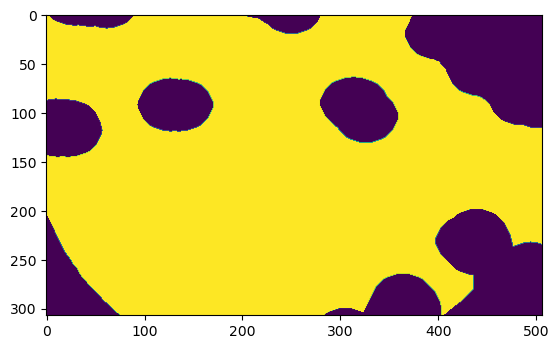

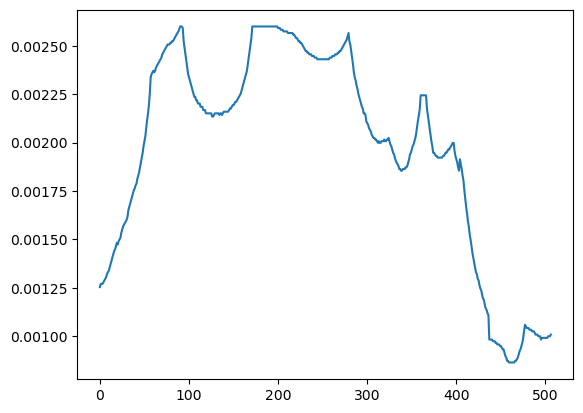

 75%|███████▍  | 71/95 [00:43<00:20,  1.14it/s]

x: 778 ---- 1285
next
y first
y: 750 ---- 808
x: 1568 ---- 1783
next


 76%|███████▌  | 72/95 [00:43<00:18,  1.27it/s]

[]
[]
y first
y: 493 ---- 731
x: 1107 ---- 1600
next


 77%|███████▋  | 73/95 [00:44<00:16,  1.36it/s]

y first
y: 500 ---- 1033
x: 821 ---- 1306
next
y first
y: 231 ---- 771
x: 1388 ---- 1904
next


 78%|███████▊  | 74/95 [00:44<00:14,  1.46it/s]

y first
y: 266 ---- 737
x: 153 ---- 605
next
y first
y: 582 ---- 1020
x: 1238 ---- 1631
next


 79%|███████▉  | 75/95 [00:45<00:13,  1.45it/s]

y first
y: 258 ---- 693
x: 463 ---- 989
next
next


 80%|████████  | 76/95 [00:46<00:12,  1.51it/s]

y first
y: 355 ---- 861
x: 0 ---- 524
next
y first
y: 679 ---- 690
x: 1196 ---- 1199
next


 81%|████████  | 77/95 [00:46<00:11,  1.52it/s]

y first
y: 850 ---- 857
x: 781 ---- 794
next
y first
y: 236 ---- 696
x: 1062 ---- 1574
next


 82%|████████▏ | 78/95 [00:47<00:11,  1.54it/s]

y first
y: 311 ---- 834
x: 34 ---- 559
next
y first
y: 400 ---- 876
x: 653 ---- 1143
next
y first
y: 252 ---- 708
x: 1360 ---- 1871
next


 83%|████████▎ | 79/95 [00:48<00:09,  1.62it/s]

y first
y: 818 ---- 843
x: 545 ---- 769
next
next


 84%|████████▍ | 80/95 [00:48<00:09,  1.59it/s]

y first
y: 526 ---- 1039
x: 172 ---- 647
next
y first
y: 411 ---- 819
x: 691 ---- 1211
next
y first
y: 433 ---- 934
x: 1247 ---- 1658
next


 85%|████████▌ | 81/95 [00:49<00:08,  1.56it/s]

y first
y: 516 ---- 1038
x: 522 ---- 1006
next
y first
y: 354 ---- 876
x: 976 ---- 1480
next
y first
y: 977 ---- 983
x: 1849 ---- 1890
next


 86%|████████▋ | 82/95 [00:50<00:08,  1.55it/s]

y first
y: 197 ---- 665
x: 41 ---- 581
next
y first
y: 573 ---- 973
x: 1229 ---- 1252
next
x first
x: 1834 ---- 1894
y: 839 ---- 920
next


 87%|████████▋ | 83/95 [00:50<00:07,  1.50it/s]

next
y first
y: 527 ---- 971
x: 1496 ---- 1511
next


 88%|████████▊ | 84/95 [00:51<00:07,  1.55it/s]

y first
y: 169 ---- 663
x: 1231 ---- 1237
next
y first
y: 1030 ---- 1034
x: 1588 ---- 1734
next


 89%|████████▉ | 85/95 [00:51<00:06,  1.58it/s]

y first
y: 373 ---- 866
x: 192 ---- 708
next
y first
y: 191 ---- 623
x: 1074 ---- 1586
next


 91%|█████████ | 86/95 [00:52<00:05,  1.64it/s]

y first
y: 355 ---- 870
x: 596 ---- 1020
next
next


 92%|█████████▏| 87/95 [00:53<00:05,  1.56it/s]

y first
y: 567 ---- 707
x: 538 ---- 582
next
y first
y: 354 ---- 803
x: 810 ---- 1318
next


 93%|█████████▎| 88/95 [00:53<00:04,  1.62it/s]

y first
y: 187 ---- 642
x: 435 ---- 932
next
y first
y: 346 ---- 798
x: 1077 ---- 1552
next


 94%|█████████▎| 89/95 [00:54<00:03,  1.64it/s]

next
y first
y: 151 ---- 696
x: 742 ---- 1152
next
y first
y: 355 ---- 820
x: 1842 ---- 1851
next


 95%|█████████▍| 90/95 [00:55<00:03,  1.65it/s]

y first
y: 787 ---- 788
x: 783 ---- 829
next
y first
y: 192 ---- 696
x: 1058 ---- 1525
next


 96%|█████████▌| 91/95 [00:55<00:02,  1.63it/s]

next
next
y first
y: 208 ---- 625
x: 1291 ---- 1804
next


 97%|█████████▋| 92/95 [00:56<00:01,  1.53it/s]

y first
y: 151 ---- 578
x: 385 ---- 900
next
y first
y: 742 ---- 794
x: 1282 ---- 1389
next


 98%|█████████▊| 93/95 [00:57<00:01,  1.52it/s]

y first
y: 136 ---- 613
x: 1223 ---- 1229
next
y first
y: 547 ---- 823
x: 1343 ---- 1753
next


 99%|█████████▉| 94/95 [00:57<00:00,  1.57it/s]

y first
y: 467 ---- 894
x: 186 ---- 706
next
y first
y: 85 ---- 577
x: 1535 ---- 1541
next
y first
y: 555 ---- 749
x: 1593 ---- 1998
next


100%|██████████| 95/95 [00:58<00:00,  1.63it/s]

y first
y: 893 ---- 946
x: 673 ---- 907
next
y first
y: 74 ---- 559
x: 1334 ---- 1764
next


In [258]:
resList = []
bgList = []
fList = []

for id in tqdm(range(len(bMap))):
    imBg2 = bMap[id].astype(np.uint8)
    im = f[id+5]
    fList.append(im)

    radius = 30  # to change
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*radius+1, 2*radius+1))
    imBg2 = cv2.morphologyEx(imBg2,  
                            cv2.MORPH_CLOSE, 
                            kernel, 
                            iterations=1) 
    
    radius = 4
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*radius+1, 2*radius+1))
    imBg2 = cv2.erode(imBg2, kernel, iterations=2) 

    kernel_height = 15
    kernel_width = 2
    kernel = np.ones((kernel_height, kernel_width), np.uint8)
    imBg2 = cv2.dilate(imBg2, kernel, iterations=1) 

    #radius = 20  # to change
    #kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*radius+1, 2*radius+1))
    #imBg2 = cv2.morphologyEx(imBg2,  
    #                        cv2.MORPH_OPEN, 
    #                        kernel, 
    #                        iterations=1) 
    
    bgList.append(imBg2)

    resList.append(isolateCells2(imBg2, thresh1 = 0.14, thresh2 = 0.05, dec1 = 20, dec2 = 20))


In [259]:
import matplotlib.animation as mat_anim
from IPython.display import HTML

def draw_frames(frames, bList, bounding_boxes):
    if len(frames) != len(bounding_boxes):
        raise Exception("The number of frames on each array doesn't match.")
    fig, axs = plt.subplots(1, 5, figsize=(16, 4))
    plt.tight_layout()

    def update(frame):
        plt.suptitle(f"Frame {frame}")
        axs[0].clear() 
        axs[1].clear()  
        axs[2].clear()  
        axs[3].clear()  
        axs[4].clear()  

        axs[0].set_title("Original")
        axs[0].imshow(frames[frame], cmap='gray')  

        axs[1].imshow(bList[frame], cmap='gray') 

        f2 = np.copy(frames[frame])

        for b in bounding_boxes[frame]:
            cv2.rectangle(f2, (b[1][0], b[0][0]), (b[1][1], b[0][1]), (0, 255, 0), 2)

        axs[2].imshow(cv2.cvtColor(f2, cv2.COLOR_BGR2RGB))
        axs[2].set_title("Circles")

        axs[3].plot(np.var(bList[frame], axis=0), 'b')
        axs[3].plot(movingAverge(np.var(bList[frame], axis=0), nb = 30), 'r')

        axs[4].plot(np.sum(bList[frame], axis=0) ** 2, 'b')
        axs[4].plot(movingAverge(np.sum(bList[frame], axis=0) ** 2, nb = 30), 'r')

        return axs

    return mat_anim.FuncAnimation(fig=fig, func=update, frames=len(frames), interval=500)


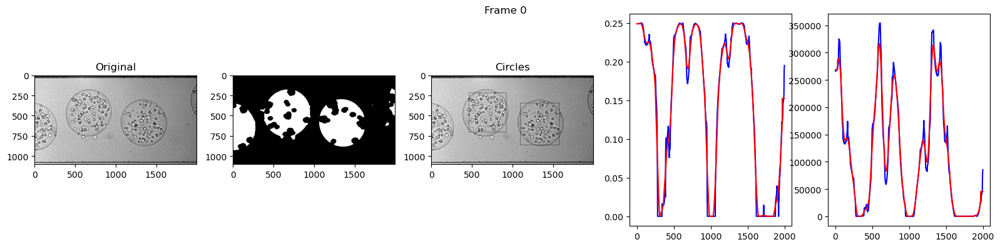

In [260]:
# 11 before moving average

animation = draw_frames(fList, bgList, resList)
HTML(animation.to_html5_video())

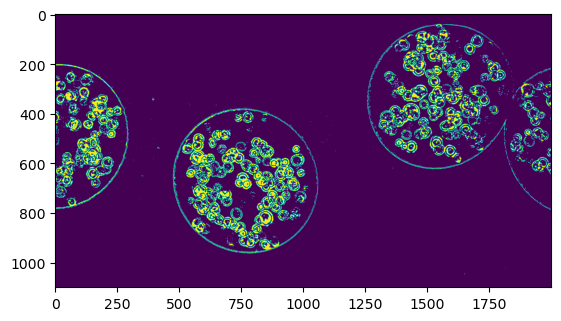

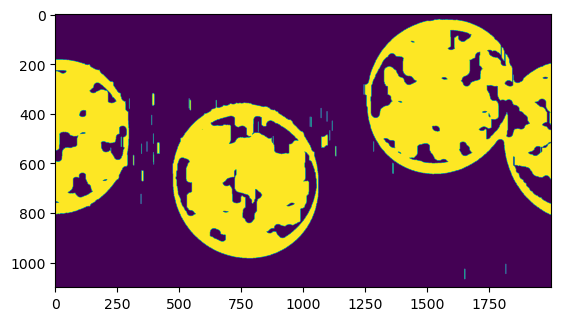

In [225]:
bg = bMap[-1].astype(np.uint8)


radius = 15  # to change
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*radius+1, 2*radius+1))
imBg2 = cv2.morphologyEx(bg,  
                        cv2.MORPH_CLOSE, 
                        kernel, 
                        iterations=1) 



kernel_height = 40
kernel_width = 2
kernel = np.ones((kernel_height, kernel_width), np.uint8)
imBg2 = cv2.dilate(imBg2, kernel, iterations=1) 

plt.imshow(bg)
plt.show()
plt.imshow(imBg2)
plt.show()


# clusters

In [4]:
from sklearn.cluster import DBSCAN, KMeans

In [8]:
id = 5
imBg2 = bMap[id].astype(np.uint8)[:, 200:-200]
im = f[id+5][:, 200:-200]


radius = 20  # to change
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*radius+1, 2*radius+1))
imBg2 = cv2.morphologyEx(imBg2,  
                        cv2.MORPH_CLOSE, 
                        kernel, 
                        iterations=1) 

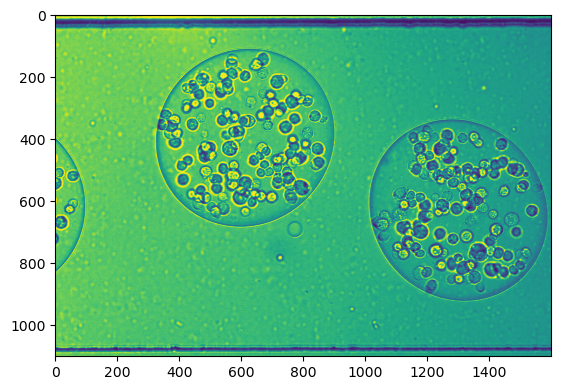

In [9]:
plt.imshow(im)

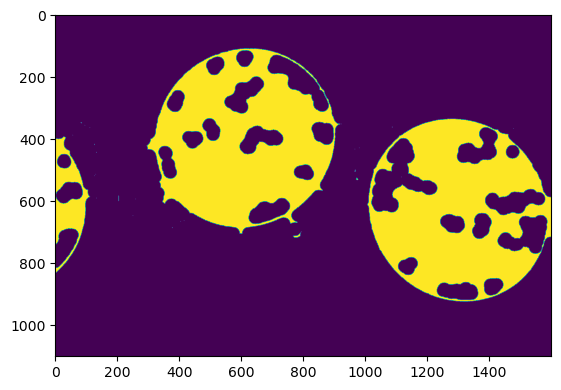

In [10]:
plt.imshow(imBg2)

In [11]:
print(im.shape)

(1100, 1600)


In [12]:
print(np.max(pos, axis = 0))

NameError: name 'pos' is not defined

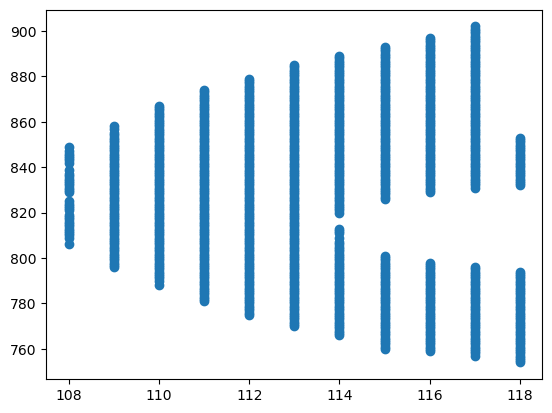

In [88]:
plt.scatter(pos[:1000, 0], pos[:1000, 1])
plt.show()

In [68]:
print(pos)

[[ 108  806]
 [ 108  809]
 [ 108  810]
 ...
 [ 923 1532]
 [ 923 1535]
 [ 923 1537]]


In [81]:
i = np.random.randint(0, pos.shape[0], 1000)

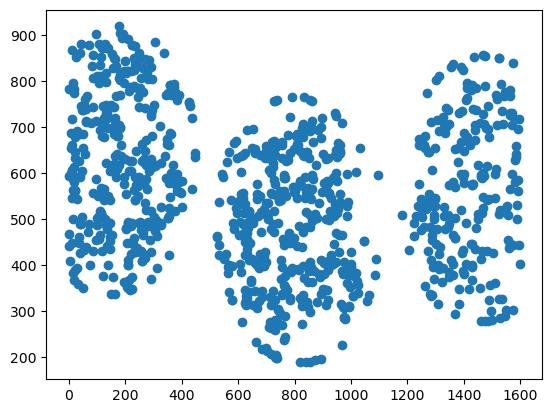

In [82]:
plt.scatter(pos[i, 1], pos[i,0])

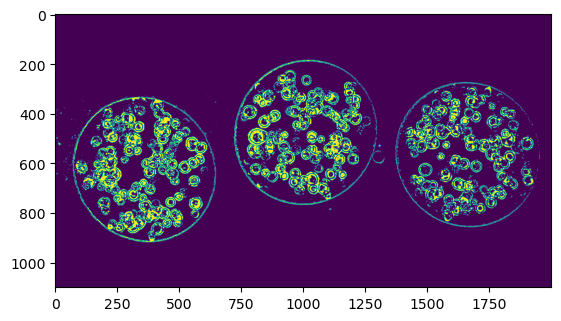

In [90]:
id = 20
delta = 200
imBg2 = bMap[id].astype(np.uint8)

#radius = 20  # to change
#kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*radius+1, 2*radius+1))
#imBg2 = cv2.morphologyEx(imBg2,  cv2.MORPH_CLOSE, kernel, iterations=1) 

plt.imshow(imBg2)


posX, posY = np.where(imBg2 == 1)
pos = np.hstack((posX.reshape(-1, 1), posY.reshape(-1, 1)))

#i = np.random.randint(0, pos.shape[0], 1000)
#pos = pos[i, :]

In [62]:
clustering = KMeans(n_clusters=2).fit(pos)

labs = clustering.labels_

c:\Users\jepi1\miniconda3\envs\pythonENV3\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [63]:
nbClust = 3

Clust1 = pos[labs == 0, :]
Clust2 = pos[labs == 1, :]
Clust3 = pos[labs == 2, :]
#Clust4 = pos[labs == 3, :]

ValueError: high <= 0

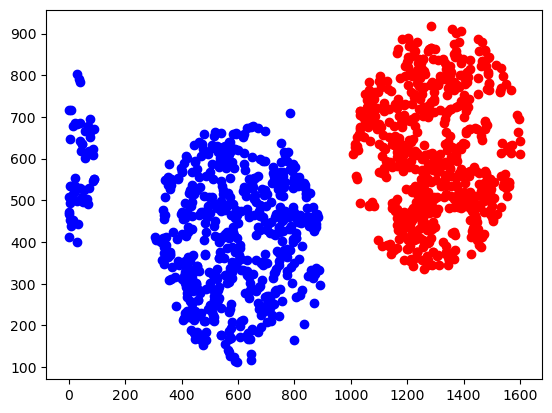

In [64]:
i = np.random.randint(0, Clust1.shape[0], 600)
plt.scatter(Clust1[i, 1], Clust1[i, 0], c='b')

i = np.random.randint(0, Clust2.shape[0], 600)
plt.scatter(Clust2[i, 1], Clust2[i, 0], c='r')

i = np.random.randint(0, Clust3.shape[0], 600)
plt.scatter(Clust3[i, 1], Clust1[i, 0], c='g')

#i = np.random.randint(0, Clust4.shape[0], 400)
#plt.scatter(Clust4[i, 1], Clust4[i, 0], c='y')

plt.show()

In [107]:
def computeClusters(pos: np.array, nbClusters:list = [2,3,4,5, 6], display:bool = False):
    
    res = []
    labsList = []
    vals = []

    for i in nbClusters:
        clustering = KMeans(n_clusters=i).fit(pos)
        res.append(clustering)
        labs = clustering.labels_
        labsList.append(labs)
        vals.append(clustering.score(pos, labs))

        print(f'number clusters {i} ===> score:{clustering.score(pos, labs)}')

        if display:
            for j in range(i):
                Clust = pos[labs == j, :]
                inds = np.random.randint(0, Clust.shape[0], 600)
                plt.scatter(Clust[inds, 1], Clust[inds, 0])

            plt.show()

    if display:
        vals = np.array(vals)
        inds = np.arange(len(vals)-1)

        plt.plot(vals[inds+1] - vals[inds])
        plt.show()

        print((vals[inds+1] - vals[inds])/vals[inds])

    return res, labsList

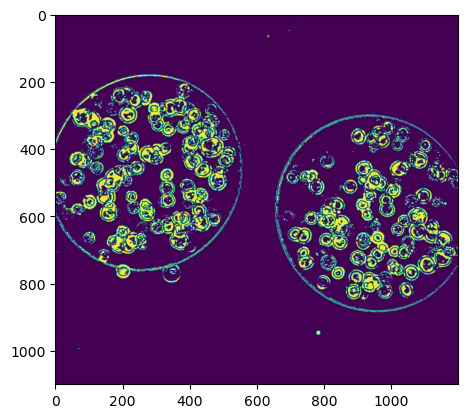

In [113]:
id = 0
delta = 200
imBg2 = bMap[id].astype(np.uint8)[:, 400:-400]

#radius = 20  # to change
#kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*radius+1, 2*radius+1))
#imBg2 = cv2.morphologyEx(imBg2,  cv2.MORPH_CLOSE, kernel, iterations=1) 

plt.imshow(imBg2)
plt.show()


posX, posY = np.where(imBg2 == 1)
pos = np.hstack((posX.reshape(-1, 1), posY.reshape(-1, 1)))

#computeClusters(pos, display=True)

db = DBSCAN(eps=500, min_samples=10).fit(pos)
labels = db.labels_

n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)


In [79]:
print(pos)

[[184 823]
 [185 799]
 [185 800]
 ...
 [918 198]
 [918 199]
 [919 179]]


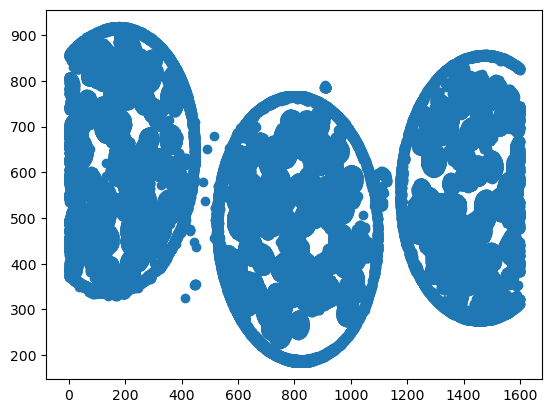

In [87]:
plt.scatter(pos[:, 1], pos[:, 0])

In [ ]:
computeClusters(pos, )

In [61]:
print(clustering.score(pos, labs))

-16524704695.751198


In [91]:
print(pos)

[[ 108  806]
 [ 108  809]
 [ 108  810]
 ...
 [ 923 1532]
 [ 923 1535]
 [ 923 1537]]


In [77]:
posX, posY = np.where(imBg2 == 1)
pos = np.hstack((posX.reshape(-1, 1), posY.reshape(-1, 1)))

clustering = KMeans(n_clusters=3).fit(pos)

labs = clustering.labels_

nbClust = 3

c:\Users\jepi1\miniconda3\envs\pythonENV3\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [78]:
nbClust = 3

Clust1 = pos[labs == 0, :]
Clust2 = pos[labs == 1, :]
Clust3 = pos[labs == 2, :]

In [79]:
print(pos.shape)
print(labs.shape)
print(np.unique(labs))

(566758, 2)
(566758,)
[0 1 2]


In [80]:
minX1 = np.min(Clust1[0])
maxX1 = np.max(Clust1[0])
minY1 = np.min(Clust1[1])
maxY1 = np.max(Clust1[1])

minX2 = np.min(Clust2[0])
maxX2 = np.max(Clust2[0])
minY2 = np.min(Clust2[1])
maxY2 = np.max(Clust2[1])

minX3 = np.min(Clust3[0])
maxX3 = np.max(Clust3[0])
minY3 = np.min(Clust3[1])
maxY3 = np.max(Clust3[1])

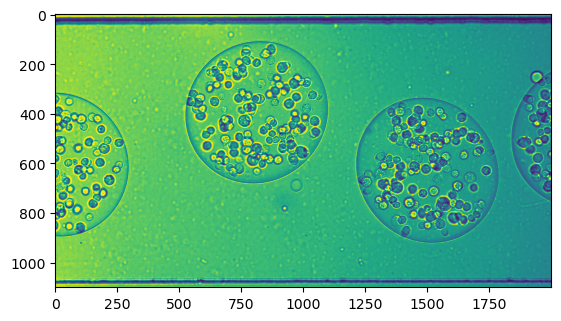

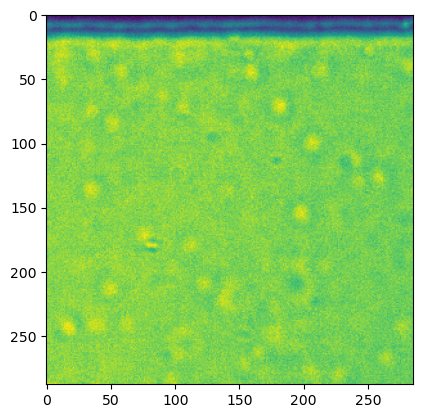

25
313


In [86]:
plt.imshow(im)
plt.show()

plt.imshow(im[minX1:maxX1, minY1:maxY1])
plt.show()

print(minY1)
print(maxY1)

# test cv2 MOG